In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
food = gpd.read_file("data/geojson/food_consumption_msoa.geojson")
food.head(2)

,id,age_0_17,age_18_64,age_65+,alcohol,alcohol_ci95,alcohol_perc2.5,alcohol_perc25,alcohol_perc50,alcohol_perc75,...,volume_std,weight,weight_ci95,weight_perc2.5,weight_perc25,weight_perc50,weight_perc75,weight_perc97.5,weight_std,geometry
0,E02000001,1018.0,4349.0,1320.0,0.340733,0.004482,0.0,0.0,0.0,0.0,...,78.221175,323.180804,1.001360,35.0,150.0,250.0,400.0,1000.0,323.685705,"MULTIPOLYGON (((-0.09679 51.52325, -0.09647 51..."
1,E02000002,2150.0,4151.0,1078.0,0.180770,0.013925,0.0,0.0,0.0,0.0,...,116.201057,397.651232,6.030232,32.5,150.0,300.0,500.0,1020.0,550.434424,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ..."


In [3]:
food.columns.values

array(['id', 'age_0_17', 'age_18_64', 'age_65+', 'alcohol',
       'alcohol_ci95', 'alcohol_perc2.5', 'alcohol_perc25',
       'alcohol_perc50', 'alcohol_perc75', 'alcohol_perc97.5',
       'alcohol_std', 'apprenticeship', 'apprenticeship_p', 'area_sq_km',
       'avg_age', 'avg_age_norm', 'carb', 'carb_ci95', 'carb_perc2.5',
       'carb_perc25', 'carb_perc50', 'carb_perc75', 'carb_perc97.5',
       'carb_std', 'energy_alcohol', 'energy_alcohol_ci95',
       'energy_alcohol_perc2.5', 'energy_alcohol_perc25',
       'energy_alcohol_perc50', 'energy_alcohol_perc75',
       'energy_alcohol_perc97.5', 'energy_alcohol_std', 'energy_carb',
       'energy_carb_ci95', 'energy_carb_perc2.5', 'energy_carb_perc25',
       'energy_carb_perc50', 'energy_carb_perc75', 'energy_carb_perc97.5',
       'energy_carb_std', 'energy_density', 'energy_fat',
       'energy_fat_ci95', 'energy_fat_perc2.5', 'energy_fat_perc25',
       'energy_fat_perc50', 'energy_fat_perc75', 'energy_fat_perc97.5',
       'ene

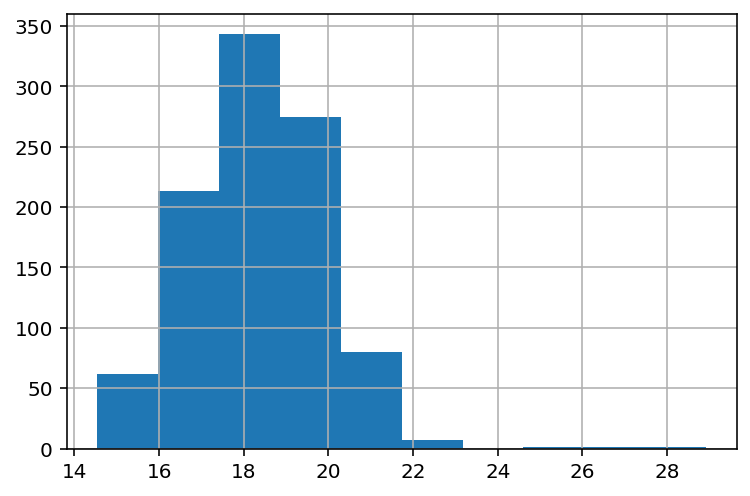

In [4]:
food['carb'].hist()

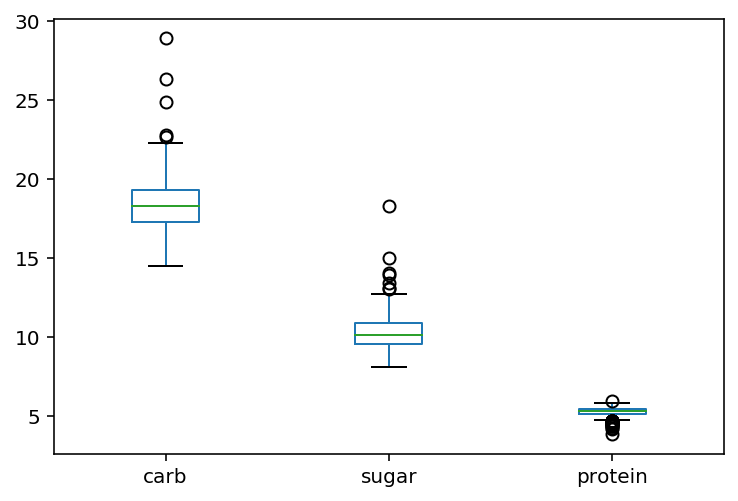

In [5]:
food[['carb', 'sugar', 'protein']].plot(kind='box')

In [6]:
nutrients = ['carb', 'fat', 'saturate', 'protein', 'sugar', 'fibre']

In [7]:
food[nutrients].corr()

,carb,fat,saturate,protein,sugar,fibre
carb,1.000000,0.493506,0.296607,-0.208538,0.789285,0.101009
fat,0.493506,1.000000,0.877382,-0.079956,0.626490,0.085285
saturate,0.296607,0.877382,1.000000,-0.180331,0.485522,-0.075503
protein,-0.208538,-0.079956,-0.180331,1.000000,-0.430765,0.248589
sugar,0.789285,0.626490,0.485522,-0.430765,1.000000,0.097655
fibre,0.101009,0.085285,-0.075503,0.248589,0.097655,1.000000


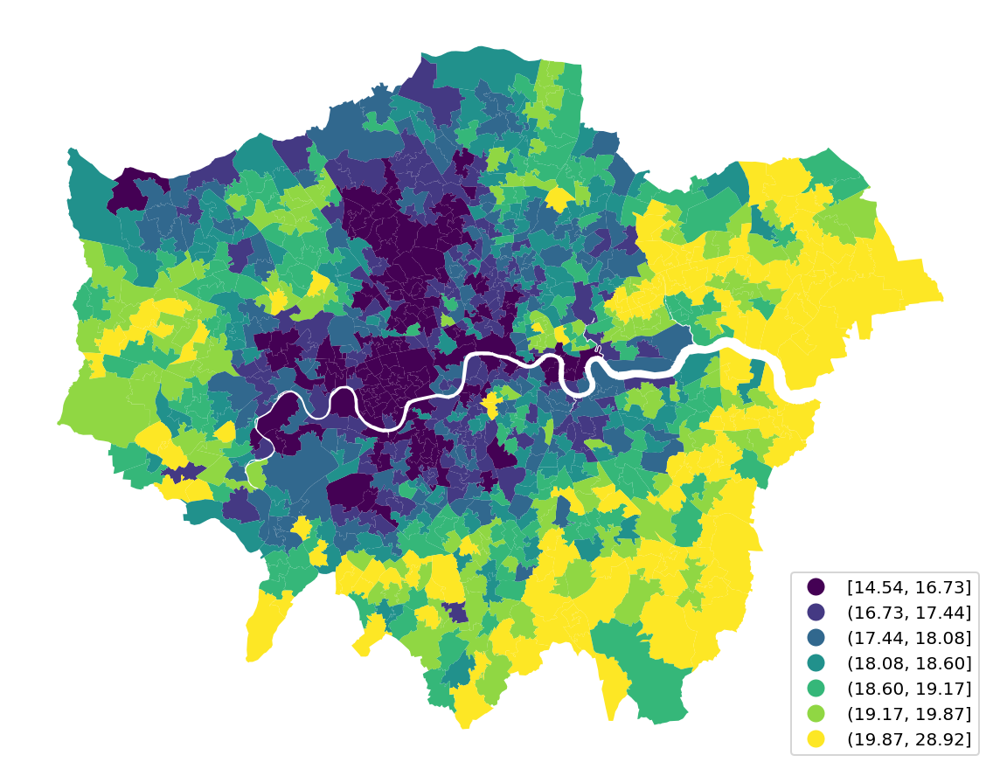

In [8]:
# https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.legend.html

f, ax = plt.subplots(figsize=(10,10))

ax.axis('off')

food.plot(
    ax = ax, 
    column = 'carb',
    scheme = 'quantiles',
    k = 7,
    legend = True,
    legend_kwds = {'loc':'lower right'}
)

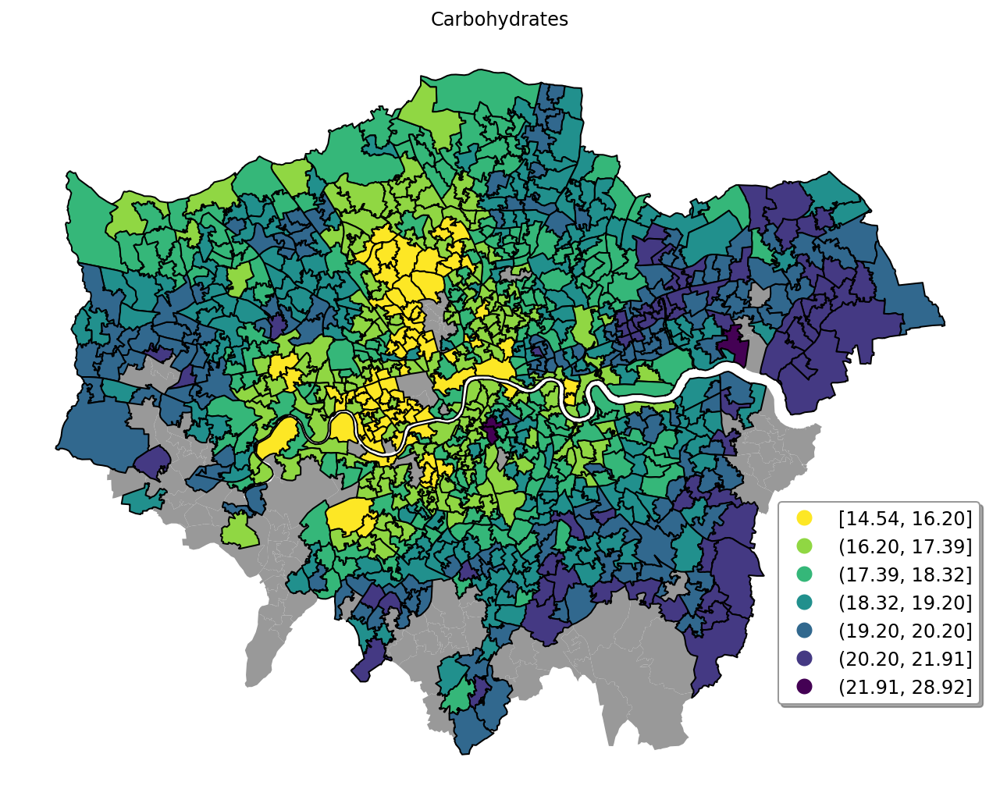

In [9]:
legend_kwds_default = {    
    'loc':'lower right', 
    'fontsize':12, 
    'shadow':True, 
    'fancybox':True, 
    'frameon':True,
    'framealpha':1.0,
    'edgecolor':'#999999',
    'facecolor':'#FFFFFF',
    'bbox_to_anchor':(1, 0.1)
}

f, ax = plt.subplots(figsize=(9,9))

ax.axis('off')
ax.set_title("Carbohydrates")

food.plot(
    ax = ax, 
    facecolor='#999999'
)

food[food['representativeness_norm']>=0.1].plot(
    ax=ax,
    column='carb',
    legend = True,
    linewidth = 1,
    edgecolor = 'black',
    scheme = 'fisherjenks',
    k = 7,
    cmap="viridis_r",
    legend_kwds = legend_kwds_default

)

plt.tight_layout()

In [10]:
import math 
from matplotlib import gridspec

def plot_attributes(features, attributes):
    
    n = len(attributes)    
    ncols = 2 
    nrows = math.ceil(n/ncols)
    fig = plt.figure(figsize=(20, 8*nrows)) 

    gs = gridspec.GridSpec(nrows, ncols, width_ratios=[1, 1]) 
    gs.update(wspace=0.0, hspace=0.1)

    plt.axis('equal')

    for i, category in enumerate(attributes):

        ax = plt.subplot(gs[i])
        ax.set_title('%s' %(attributes[i]), fontsize=20)
        ax.set_axis_off()

        features.plot(
            ax = ax, 
            facecolor='#999999'
        )

        features[features['representativeness_norm']>=0.1].plot(
            ax=ax,
            column=category,
            legend = True,
            linewidth = 1,
            edgecolor = 'black',
            scheme = 'fisherjenks',
            k = 7,
            cmap="viridis_r",
            legend_kwds = legend_kwds_default

        )

    plt.gca().set_axis_off()
    plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
                hspace = 0, wspace = 0)
    return fig

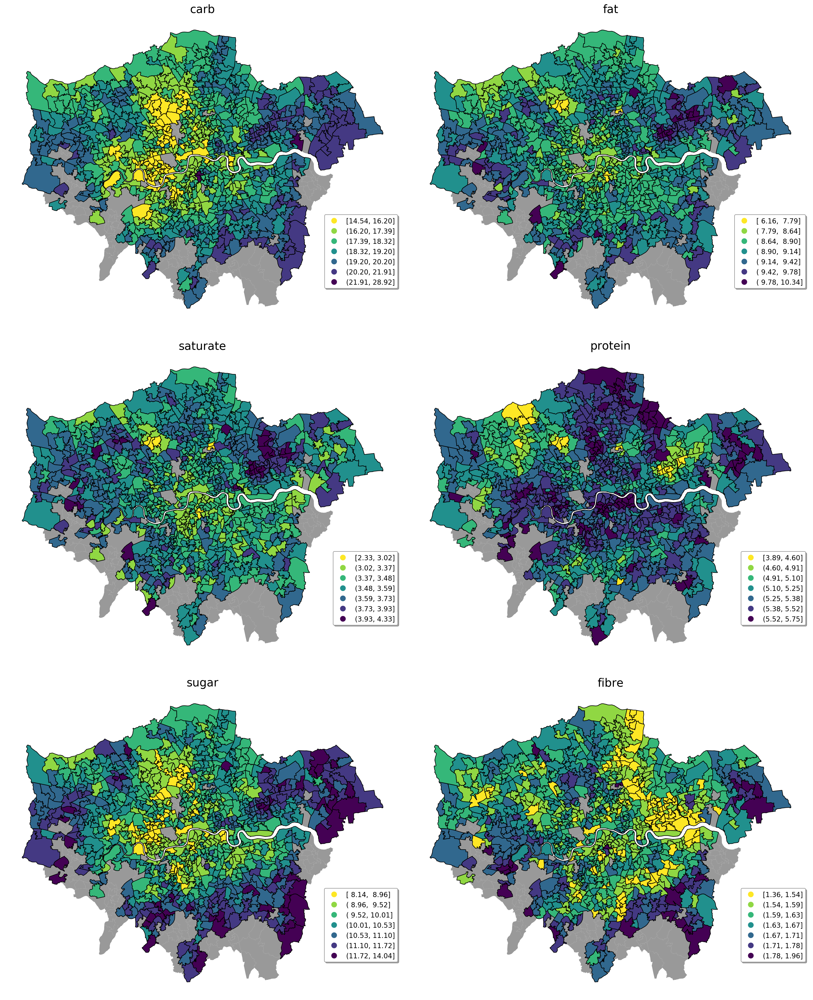

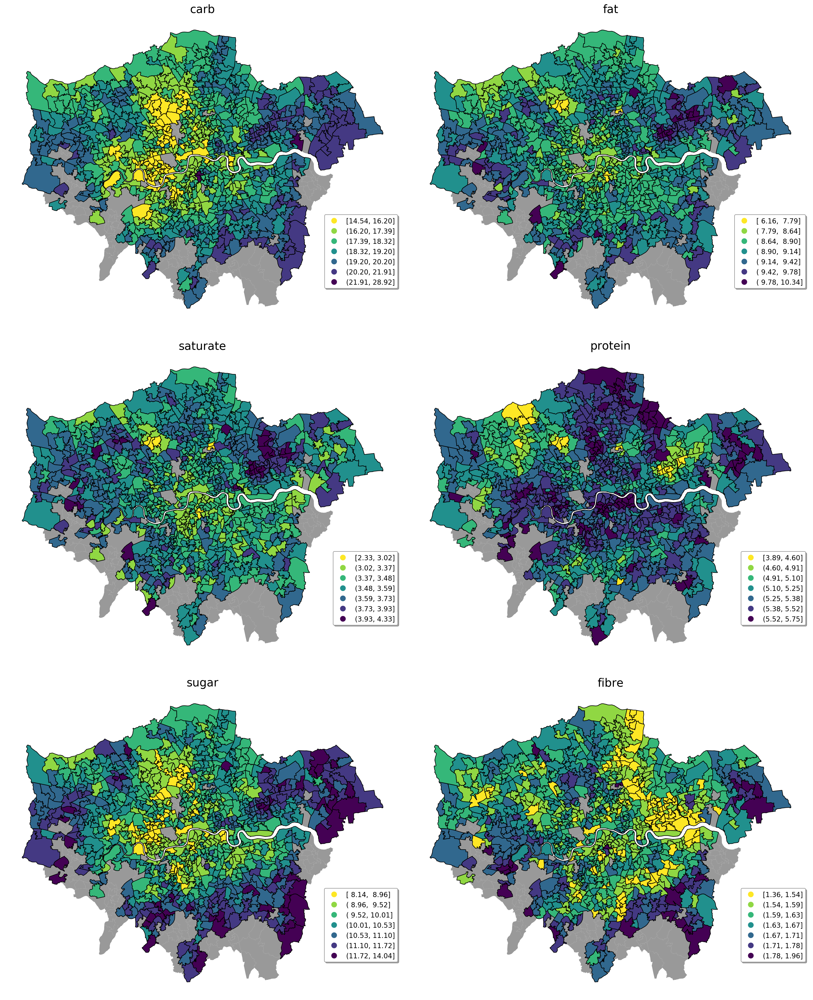

In [11]:
plot_attributes(food, nutrients)